**CoherentNet:**
*An optimized model for raw audio generation*

_This notebook implements CoherentNet, a model that was designed to generate coherent sounds with long term dependencies, improved performances and a decent sample rate._

Key features:
    - Entropy based gaussian pre-processing
    - μ-Law encoding
    - GRU Cells
    
Citations:
    - Music Genre Classification based on Entropy and fractal lunacrity (http://ieeexplore.ieee.org/document/6123402/)
    - WaveNet: A Generative Model for Raw Audio (https://arxiv.org/pdf/1609.03499.pdf)
    
Author: Boris Musarais

    The Sound:

In [3]:
import IPython
IPython.display.Audio("inputs/sounds/piano1.wav")

    The Result:

In [4]:
import IPython
IPython.display.Audio("graphs/EntropyGraph/outputs/generated03_15%.wav")

In [5]:
import IPython
IPython.display.Audio("graphs/EntropyGraph/outputs/generated04_20%.wav")

In [6]:
import IPython
IPython.display.Audio("graphs/EntropyGraph/outputs/generated05_20%.wav")

    Phase 1: Training...

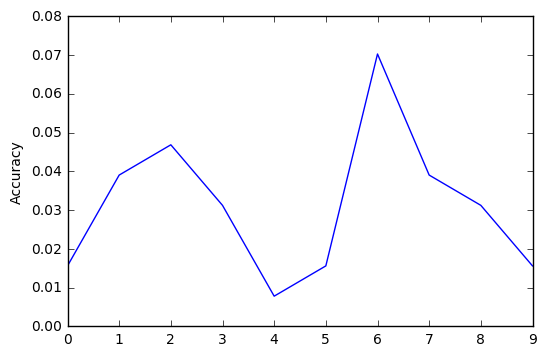

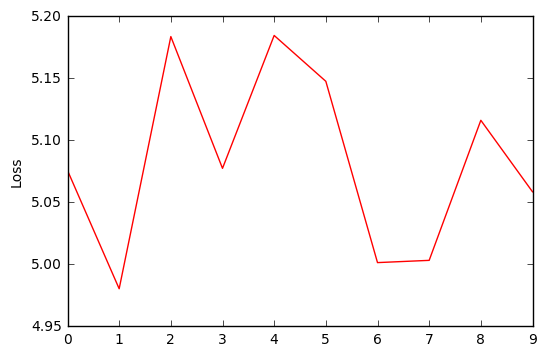

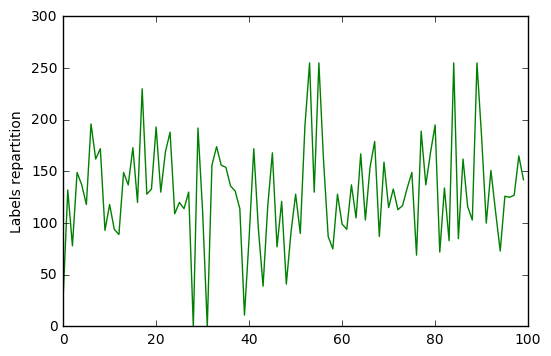

Iter 14080, Loss= 4.985400, Accuracy= 0.07031, Lrn Rate= 0.001 cpu: 0.58s, gpu: 1.0s time: 2mins pool: 0


In [ ]:
from helpers.extractor import *
from helpers.sound_tools import *
from helpers.neural_network import *

loader = SoundLoader(sound="inputs/sounds/flower.wav",
                     fixed_size=8*8, 
                     sample_size=0, 
                     #insert_global_input_state = 4,
                     one_hot = 256,
                     uLaw = 256,
                     amplitude = 1,
                     label_offset=0, 
                     samplerate = 441*6,
                     n_steps = 8*8,
                     entropy = {"step":1, "increase_rate":4, "max_step":9999, "size":64},
                     )

loader.use_avg = True

network = ConvNet(loader, 
                  training_iters=1000000, 
                  display_step=10, 
                  save_step = 30000,
                  learning_rate = 0.001, 
                  decay_step = 10000000,
                  decay_rate = 0.95,
                  batch_size = loader.batch_size,
                  n_steps = loader.n_steps,
                 )

print(network.n_input)
print(network.n_classes)

x=tf.placeholder(tf.float32, [None, 8*8*2, 1], "X")

gru = GRUOperation(cells=[512]*2, n_classes=network.n_classes)

layers = []
layers.append(gru)

network.Run(layers, 
            x=x, 
            restore_path="graphs/EntropyGraph2", 
            save_path="graphs/EntropyGraph2",
            state = gru.state,
           )


    Phase 2: Generation

sample_state: 0.011810093693409926
status: 600/26460 [0.49609375] 665


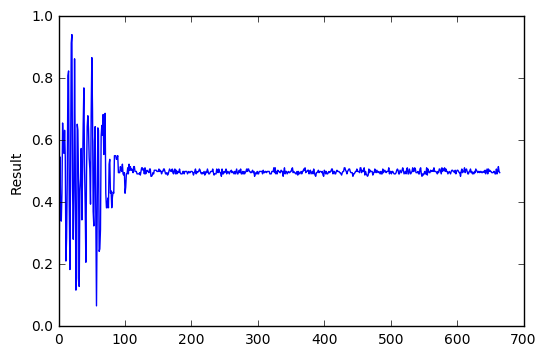

KeyboardInterrupt: 

In [2]:
from helpers.extractor import *
from helpers.sound_tools import *
from helpers.neural_network import *

N_STEPS = 8*8

loader = SoundLoader(sound="inputs/sounds/flower.wav",
                     fixed_size=N_STEPS, 
                     sample_size=0, 
                     one_hot = 256,
                     uLaw = 256,
                     amplitude = 1,
                     samplerate = 441*6,
                     n_steps = N_STEPS,
                     random = True,
                     entropy = {"step":1, "increase_rate":4, "max_step":999, "size":N_STEPS},
                     )

loader.use_avg = True

network = ConvNet(loader, n_steps=loader.n_steps)

x=tf.placeholder("float", [None, N_STEPS*2, 1])

gru = GRUOperation(cells=[512]*2, n_classes=network.n_classes)

#--------------------------------------------------------------------------------------------
#Layers
layers = []
layers.append(gru)
#End layers
#--------------------------------------------------------------------------------------------

batch = loader.getNextTimeBatch(1, n_steps=network.n_steps)

print(loader.converter.last_sample_position)

data = loader.converter.Extract(0, loader.converter.last_start_index, multiplier=loader.multiplier*loader.amplitude, offset=loader.multiplier/2, uLawEncode = loader.uLawEncode)

prediction = network.Generate(batch[0][0][N_STEPS:], 
                              "graphs/EntropyGraph2", 
                              x = x,
                              layers = layers, 
                              iterations=441*6*10, 
                              display_step = 100,
                              epsilon = 0, 
                              start_samples = batch[0][0][:N_STEPS],
                              state = gru.state,
                              #input_buffer = data
                             )

print(loader.converter.last_sample_position)
p

In [2]:
from helpers.extractor import *
from helpers.sound_tools import *
from helpers.neural_network import *
converter = SoundConverter("")
data = converter.TensorToSound(network.generation_result, "outputs/generated.wav", multiplier=1, offset=0, samplerate=loader.samplerate)

import IPython
IPython.display.Audio("outputs/generated.wav")

Sound saved as: outputs/generated.wav


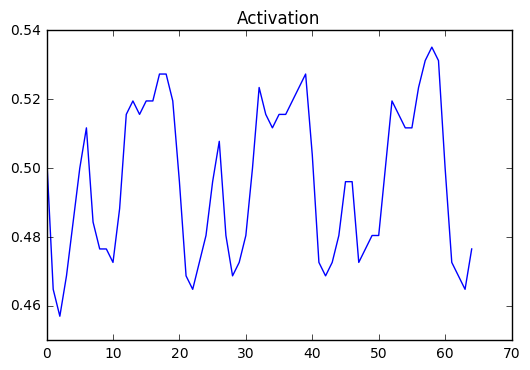

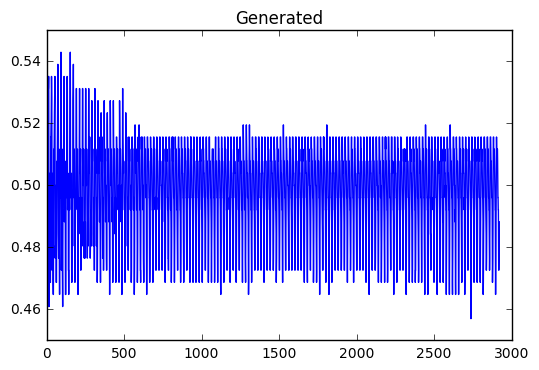

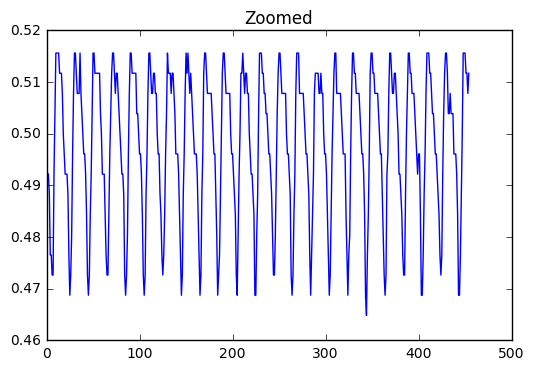

In [3]:
import matplotlib.pyplot as plt
plt.plot(network.generation_result[0:loader.fixed_size])
plt.title("Activation")
plt.show()
plt.plot(network.generation_result[loader.fixed_size:])
plt.title("Generated")
plt.show()
plt.plot(network.generation_result[loader.fixed_size*13:20*loader.fixed_size])
plt.title("Zoomed")
plt.show()

Testing input...

In [4]:
from IPython.core.debugger import Tracer

import IPython
from helpers.extractor import *
from helpers.sound_tools import *
from helpers.neural_network import *

loader2 = SoundLoader(sound="inputs/sounds/flower.wav",
                     fixed_size=128*128*4, 
                     sample_size=0.1, 
                     one_hot = 10,
                     uLaw = 256,
                     samplerate=441*6,
                     random=False,
                     amplitude = 0.5,
                     )
print("multiplier: "+str(loader2.multiplier))

_t = time.process_time()
init_batch = loader2.getNextBatch(1)
duration = time.process_time()-_t

print("duration: "+str(duration))

plt.show()

print(ConvNet.max_index(data=init_batch[1][0])/256)

converter = SoundConverter("")
data = converter.TensorToSound(init_batch[0][0], "outputs/initial.wav", multiplier=1, offset=0, samplerate=loader2.samplerate)

IPython.display.Audio("outputs/initial.wav")

multiplier: 1
duration: 0.1875
0.015625
Sound saved as: outputs/initial.wav


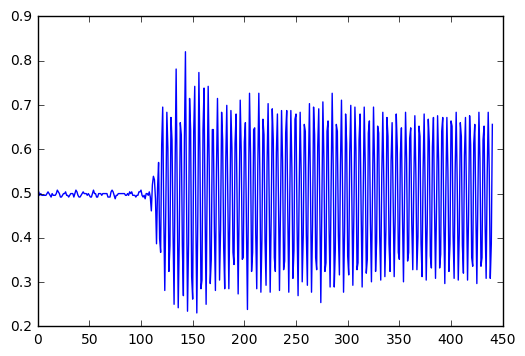

In [11]:
import matplotlib.pyplot as plt
plt.plot(init_batch[0][0][441*2:441*3])
plt.show()

Testing per case prediction accuracy

In [ ]:
#Test...

from helpers.extractor import *
from helpers.sound_tools import *
from helpers.neural_network import *

loader = SoundLoader(sound="inputs/sounds/3129775.wav",
                     fixed_size=8*8, 
                     sample_size=0.75, 
                     extract_length = 1,
                     one_hot = 256,
                     uLaw = 256,
                     samplerate=441,
                     #random=False,
                     insert_global_input_state = 4,
                     )

network = ConvNet(loader, n_steps=8)

x=tf.placeholder("float", [None, 8+loader.insert_global_input_state, 8])

#--------------------------------------------------------------------------------------------
#Layers
layers = []
layers.append(GRUOperation(cells=[256], n_classes=network.n_classes))
#End layers
#--------------------------------------------------------------------------------------------

start_point = 0
_tmp = loader.getNextTimeBatch(1, n_steps = 8)

print(_tmp)

prediction = network.Predict(_tmp[0][0], 
                              "graphs/AudioGenerationGraph", 
                              x = x,
                              layers = layers, 
                             )
print(prediction)
predicted_val = network.max_index(prediction[0])/network.loader.one_hot

real_val = network.max_index(_tmp[1][0])/network.loader.one_hot

print("real: "+str(real_val))
print("predicted: "+str(predicted_val))
print("error: "+str(abs(predicted_val-real_val)))